In [1]:
import os
os.environ["OMP_NUM_THREADS"] = "32"

In [148]:
from graph_tool.all import *
import pandas as pd
import numpy as np
import scipy as sp
from sklearn.covariance import LedoitWolf, OAS
import matplotlib.pyplot as plt
import matplotlib.cm as mpl
import seaborn as sns
import statsmodels.api as sm
from multipy.fdr import qvalue
from multipy.fdr import lsu

In [3]:
### Input expression data
gene_expr_body = pd.read_table("/Genomics/ayroleslab2/lamaya/bigProject/eQTLcatalog/modularity/matrices/VOOMCounts_CPM5_counts4M_covfree_body_ctrl_onlygenesinmainchr_Jul20.21.txt")
gene_expr_head = pd.read_table("/Genomics/ayroleslab2/lamaya/bigProject/eQTLcatalog/modularity/matrices/VOOMCounts_CPM5_counts4M_covfree_head_ctrl_onlygenesinmainchr_Jul20.21.txt")

In [112]:
gene_expr_body

,108_C8,112_A12,112_B12,112_D7,112_E12,112_F8,112_F7,112_F6,112_G12,112_G8,...,25_G6,25_G5,25_H3,25_H10,25_H9,25_H8,25_H7,25_H6,25_H5,25_H4
FBgn0052350,4.672873,4.740420,4.528366,3.984495,5.393248,4.324842,4.443242,6.176375,4.317070,3.722727,...,4.713766,4.418189,4.289360,5.274273,4.763017,4.952494,5.261288,5.190856,3.797916,4.121558
FBgn0024733,12.695032,12.559422,12.726410,12.797517,12.257089,12.271802,12.830374,12.806576,12.262167,12.990267,...,12.491434,12.244108,12.607845,12.551870,12.569502,12.754213,12.485194,12.949873,12.695900,12.565790
FBgn0040372,6.000547,6.654485,7.031838,6.111535,5.452908,6.905525,6.860039,3.625288,7.368486,4.245104,...,6.015419,6.767563,5.788287,6.101702,6.030205,5.834524,6.065159,5.697182,5.910896,5.995061
FBgn0023536,4.011901,2.976783,4.924999,4.223323,5.298366,4.399118,2.258474,3.312484,4.947382,3.826690,...,4.240139,4.897454,3.493284,2.709044,4.921365,4.349449,4.431203,3.482980,2.535859,4.307067
FBgn0023537,7.338484,7.541150,7.352289,7.141141,7.381344,7.231803,6.834662,7.359264,6.779542,7.074368,...,7.283837,7.272398,7.867830,7.479042,7.363879,7.004133,6.996279,7.059080,7.524204,7.451933
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FBgn0031313,5.911469,6.174153,6.366375,6.095470,6.143625,5.862988,6.064760,6.059551,5.466830,6.440606,...,5.074191,5.876818,6.613647,6.329462,5.254680,6.003629,5.781781,5.749880,6.650797,5.815105
FBgn0031309,4.745208,4.728252,5.803887,4.742845,4.876625,5.738869,4.776673,5.517526,4.767070,4.371807,...,4.515374,5.474883,3.769196,5.058897,4.518515,4.152469,4.934488,4.860974,5.923766,5.036427
FBgn0031305,4.759798,4.619091,5.492252,4.432477,5.258968,4.107168,6.169486,5.302106,3.409818,3.380427,...,5.163458,4.879091,5.329155,5.517174,4.868487,3.976340,5.143842,4.650204,5.652081,4.094609
FBgn0016926,7.339688,7.190200,7.437489,7.478031,7.878135,7.093216,7.168469,7.460104,7.069632,8.042251,...,7.538871,7.176419,7.840483,7.639619,7.124281,7.290694,7.044730,7.565679,6.966681,7.555617


In [4]:
gene_expr_dict = {"head": gene_expr_head.T, "body": gene_expr_body.T}

In [186]:
gf = load_graph("../data/output/SBM/graphs/body_fdrLevel-1e-07_genes-2212_density-0.046.xml.gz")

In [6]:
def filterByEdge(g, corr, cutOff, keepOnlyMain):
    # Filtering edges
    corr = g.edge_properties[corr]
    sign = g.new_ep("bool", True)
    sign.a = np.array(np.abs(corr.a) > cutOff)

    tv = GraphView(g, efilt=sign)

    # Keeping largest component
    if keepOnlyMain:
        comp, hist = label_components(tv)
        main_component = tv.new_vp("bool", (comp.a == np.where(hist == max(hist))[0][0]))
        tv.vertex_properties["main_component"] = main_component
        tv.set_vertex_filter(main_component)
    return tv
def getMainComponent(tv):
    comp, hist = label_components(tv)
    main_component = tv.new_vp("bool", (comp.a == np.where(hist == max(hist))[0][0]))
    tv.vertex_properties["main_component"] = main_component
    tv.set_vertex_filter(main_component)
    return tv


In [109]:
pvals = np.array(g.edge_properties["pvalue"].a)
fdr_01 = g.new_ep("bool", True)
fdr_01.a = lsu(pvals, q=0.001)
tv_fdr01 = GraphView(g, efilt=fdr_01)

tv = filterByEdge(tv_fdr01, "spearman", 0.0, True)
gf = Graph(tv, prune = True)

In [187]:
gf.ep.sign = gf.new_edge_property("int", (np.sign(gf.ep.spearman.a) + 1)/2)
gf.ep.layer = gf.new_edge_property("int16_t", np.sign(gf.ep.spearman.a).astype(np.int16))
gf.ep.layer.a = np.sign(gf.ep.spearman.a).astype(np.int16)
gf.ep.z_s = gf.new_edge_property("double", np.abs((2*np.arctanh(gf.ep.spearman.a))))

In [188]:
N = len(gf.get_vertices())
Et = (N * N - N)/2
E = len(gf.get_edges())
[N, E, E/Et]

[2212, 113542, 0.046431495326262]

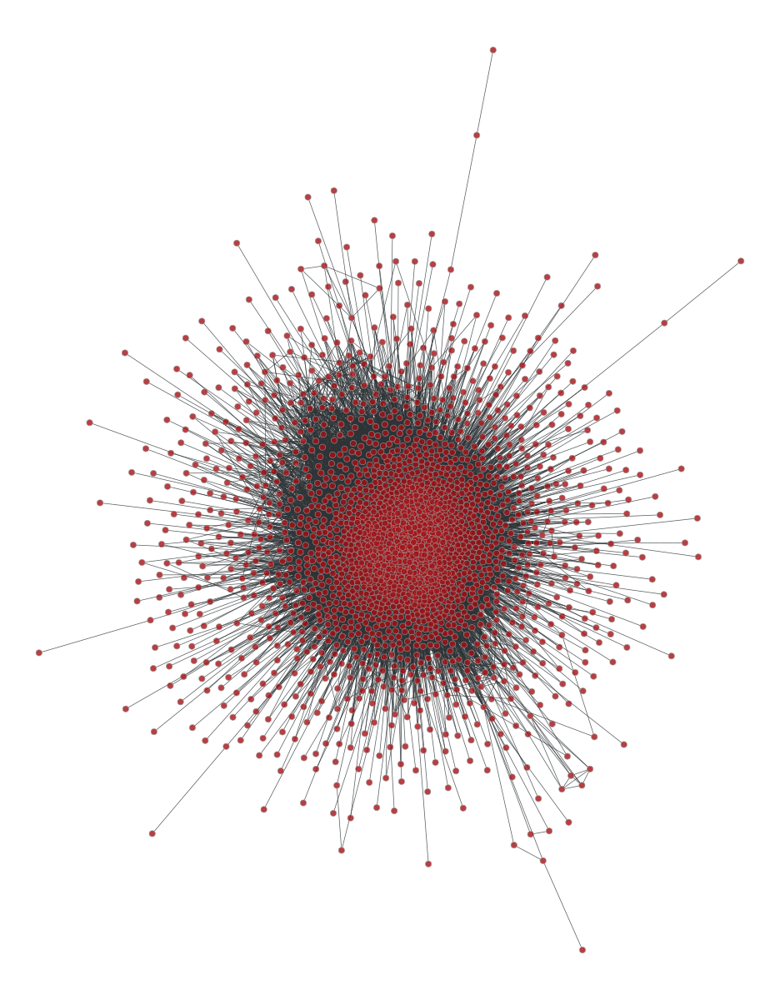

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd4642d13a0, at 0x7fd45ecdd910>

In [189]:
graph_draw(gf)

In [16]:
gene_list = []
for i in gf.vertex_properties['genes']:
    gene_list.append(i)
#gene_expr_body.T[gene_list].T.to_csv("../data/VOOMCounts_CPM5_counts4M_covfree_body_ctrl_onlygenesinmainchr_Jul20.21_filtered_by_spearman-0.325.csv")

In [190]:
%%time

state_z_s = minimize_nested_blockmodel_dl(gf, state_args=dict(recs=[gf.ep.z_s],
                                                              rec_types=["real-normal"]))
mcmc_equilibrate(state_z_s, wait=2, mcmc_args=dict(niter=10))

CPU times: user 7min 38s, sys: 1.11 s, total: 7min 40s
Wall time: 7min 40s


(154388.51947389814, 938984, 71107)

In [115]:
%%time

state_sign = minimize_nested_blockmodel_dl(gf, state_args=dict(recs=[gf.ep.sign, gf.ep.z_s],
                                                               rec_types=["discrete-binomial", "real-normal"]))
mcmc_equilibrate(state_sign, wait=2, mcmc_args=dict(niter=10))

CPU times: user 1h 2min 43s, sys: 5min 49s, total: 1h 8min 32s
Wall time: 1h 12min 1s


(832645.4246728824, 4962907, 250313)

In [113]:
%%time

state_layered = minimize_nested_blockmodel_dl(gf, state_args=dict(base_type=LayeredBlockState,
                                                                  ec=gf.ep.layer, 
                                                                  layers=True, 
                                                                  recs=[gf.ep.z_s],
                                                                  rec_types=["real-normal"]))
mcmc_equilibrate(state_layered, wait=100, mcmc_args=dict(niter=10))

CPU times: user 11h 46min 27s, sys: 7min 20s, total: 11h 53min 47s
Wall time: 12h 54min 21s


(807908.2027116318, 105304618, 4476833)

In [121]:
levels = state_sign.get_levels()
[s.get_nonempty_B() for s in levels]

[67, 16, 5, 3, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [122]:
levels = state_layered.get_levels()
[s.get_nonempty_B() for s in levels]

[76, 14, 5, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

In [140]:
levels = state_z_s.get_levels()
[s.get_nonempty_B() for s in levels]

[77, 17, 5, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [192]:
levels = state_z_s.get_levels()
[s.get_nonempty_B() for s in levels]

[43, 10, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

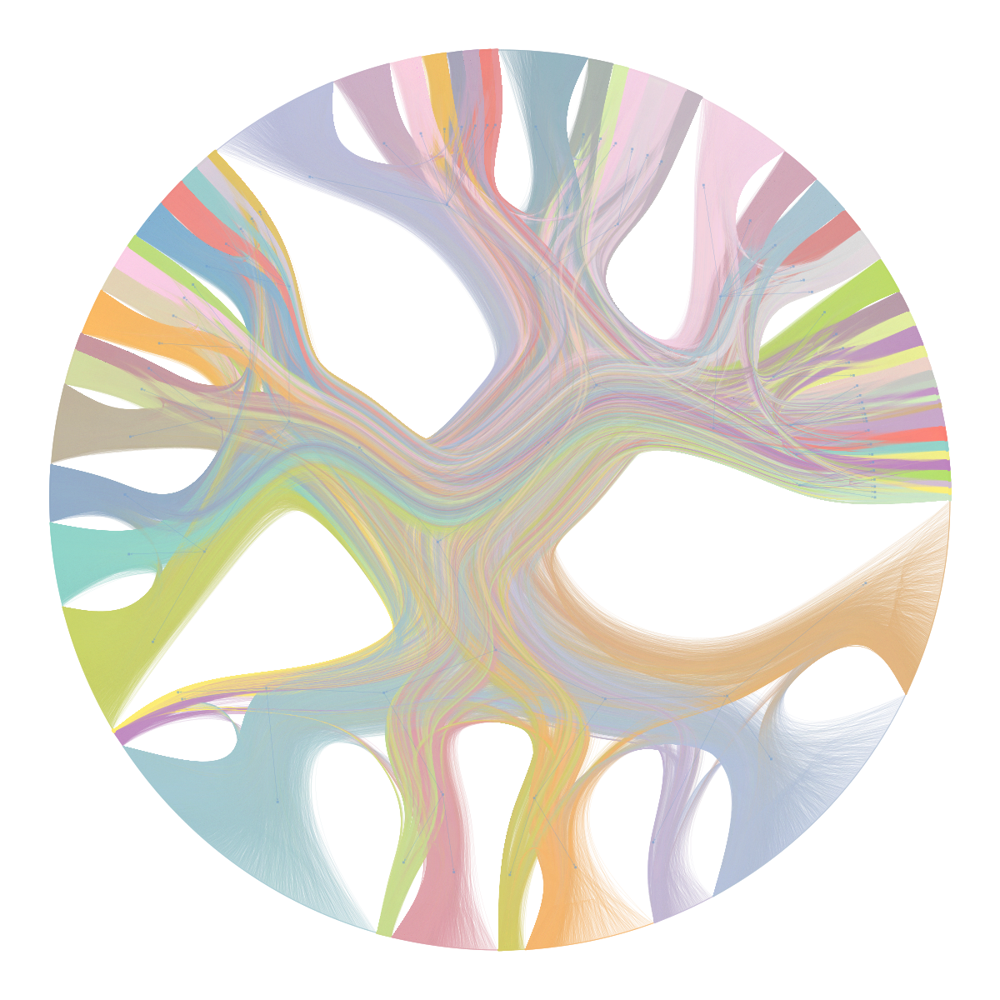

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd5ef234d00, at 0x7fd45eb5f970>,
 <Graph object, directed, with 5537 vertices and 5536 edges, at 0x7fd45f9e6790>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd45f9e6790, at 0x7fd45eb5d670>)

In [116]:
state_sign.draw()

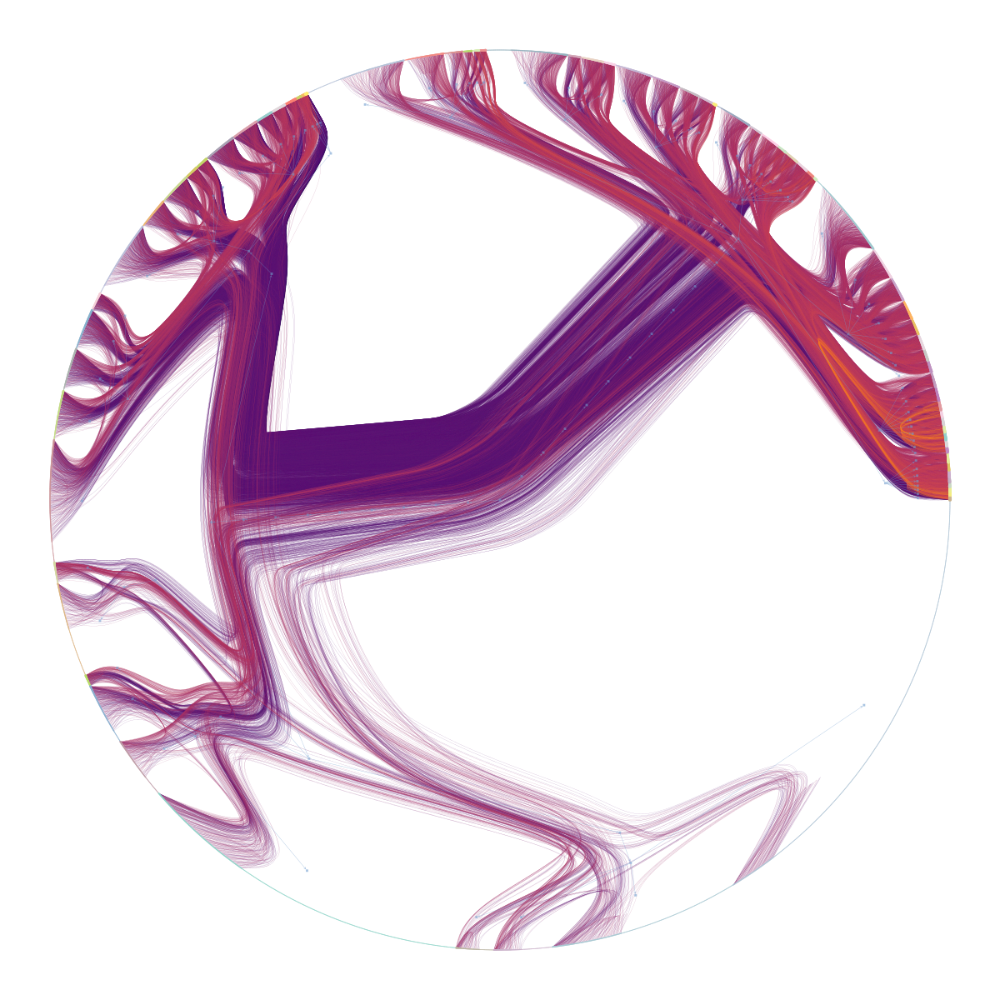

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd5ef234d00, at 0x7fd53b2010d0>,
 <Graph object, directed, with 5560 vertices and 5559 edges, at 0x7fd5ef592f70>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd5ef592f70, at 0x7fd53b1f6fa0>)

In [170]:
state_layered.draw(edge_color=prop_to_size(gf.ep.z_s, power=1, log=False),
                   ecmap=(mpl.inferno, .6), edge_gradient=[], eorder=gf.ep.z_s, subsample_edges = 20000)

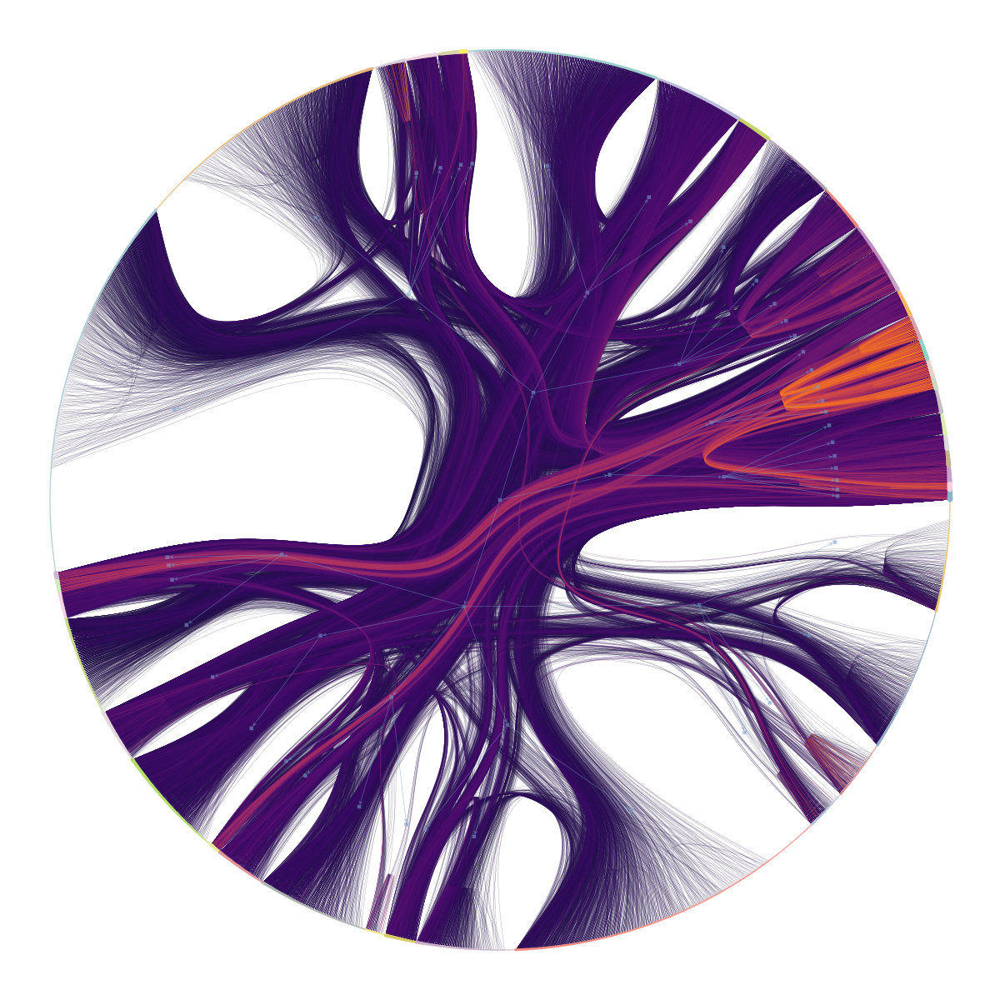

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd4642d13a0, at 0x7fd45edea310>,
 <Graph object, directed, with 2269 vertices and 2268 edges, at 0x7fd45ef50220>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd45ef50220, at 0x7fd549eab400>)

In [191]:
state_z_s.g = gf
state_z_s.draw(edge_color=prop_to_size(gf.ep.z_s, mi=-2, ma=4, power=1, log=False),
               ecmap=(mpl.inferno, .6), edge_gradient=[], eorder=gf.ep.z_s, subsample_edges = 50000)

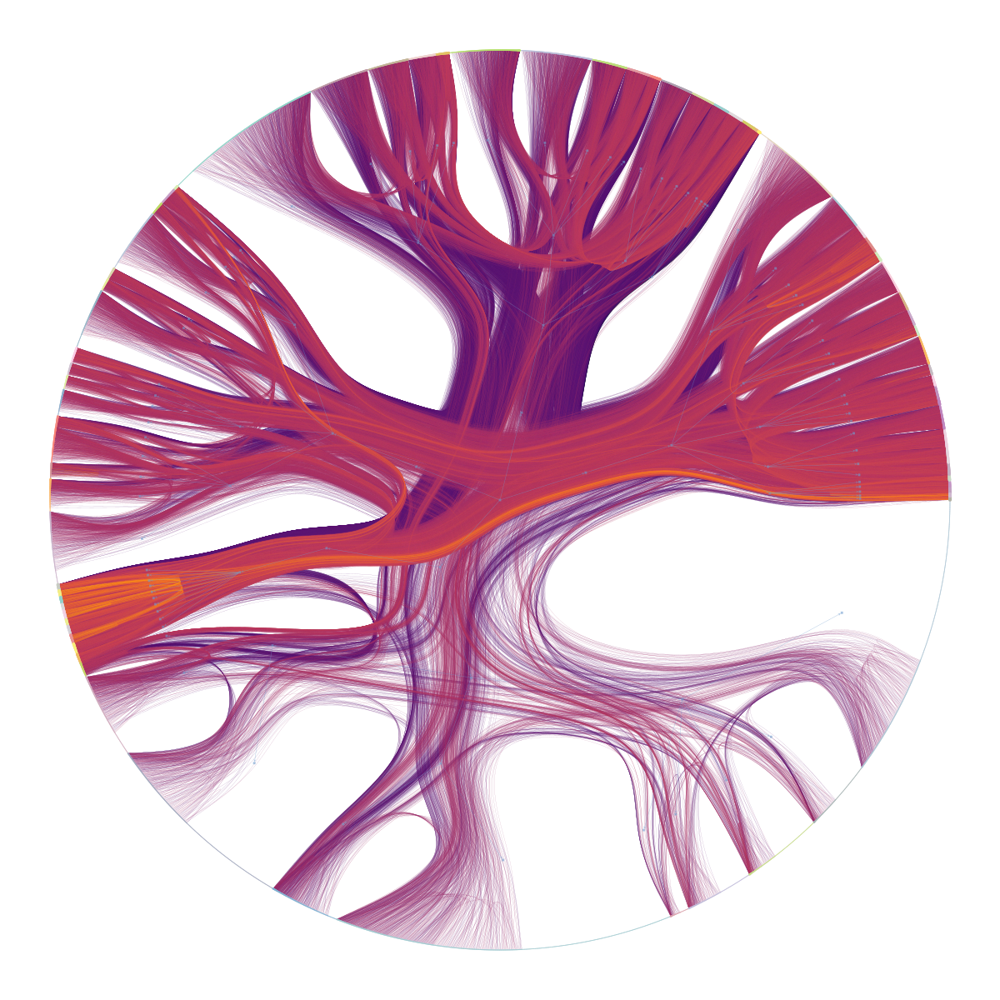

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd5ef234d00, at 0x7fd45ee31a30>,
 <Graph object, directed, with 5547 vertices and 5546 edges, at 0x7fd45eb874c0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd45eb874c0, at 0x7fd45ee4a130>)

In [183]:
state_z_s.g = gf
state_z_s.draw(edge_color=prop_to_size(gf.ep.z_s, mi=-2, ma=4, power=1, log=False),
               ecmap=(mpl.inferno, .6), edge_gradient=[], eorder=gf.ep.z_s, subsample_edges = 50000)

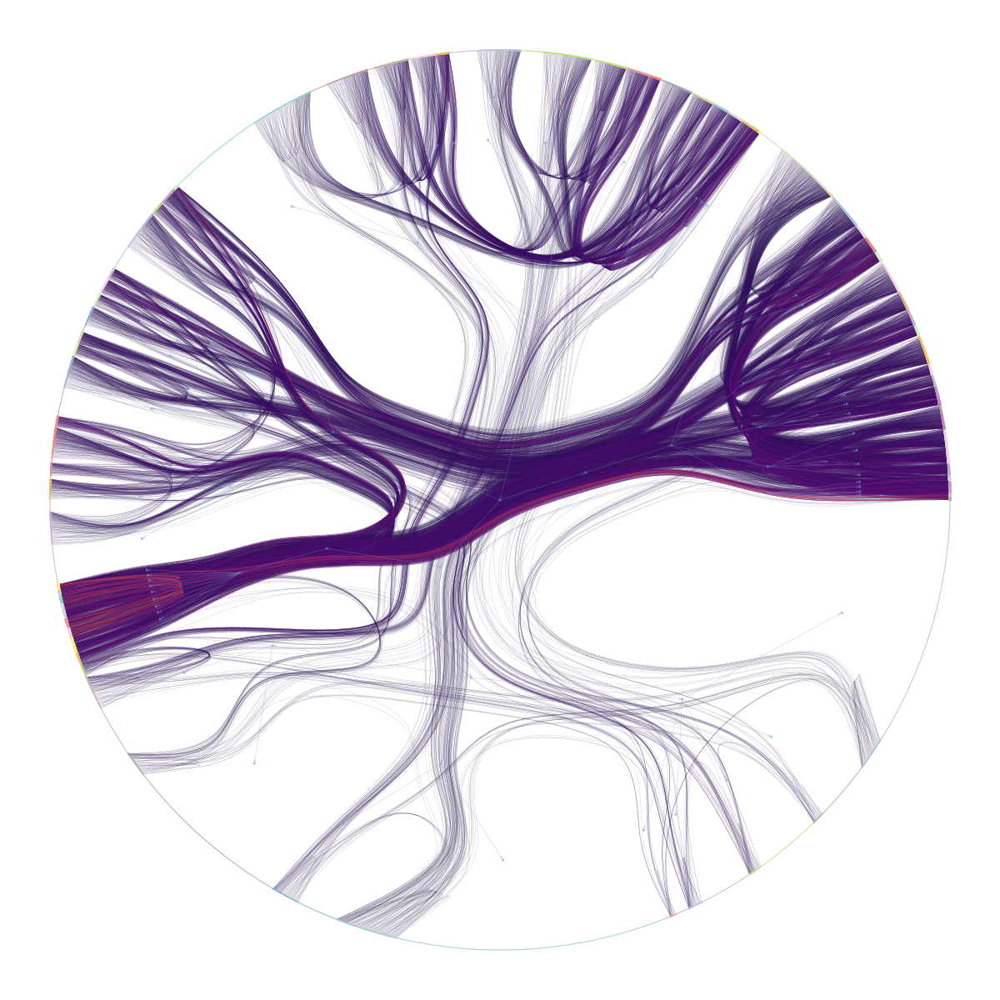

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd5ef234d00, at 0x7fd45edf9520>,
 <Graph object, directed, with 5547 vertices and 5546 edges, at 0x7fd5e549a9a0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd5e549a9a0, at 0x7fd45edf9700>)

In [181]:
state_z_s.g = gf
layer_1 = state_z_s.g.new_ep("bool", True)
layer_1.a = state_z_s.g.ep.layer.a == 1
state_z_s.g = GraphView(state_z_s.g, efilt=layer_1)

state_z_s.draw(edge_color=prop_to_size(state_z_s.g.ep.z_s, mi=0, ma=4, power=1, log=False),
               ecmap=(mpl.inferno, .6), edge_gradient=[], 
               eorder=state_z_s.g.ep.z_s, subsample_edges = 10000)

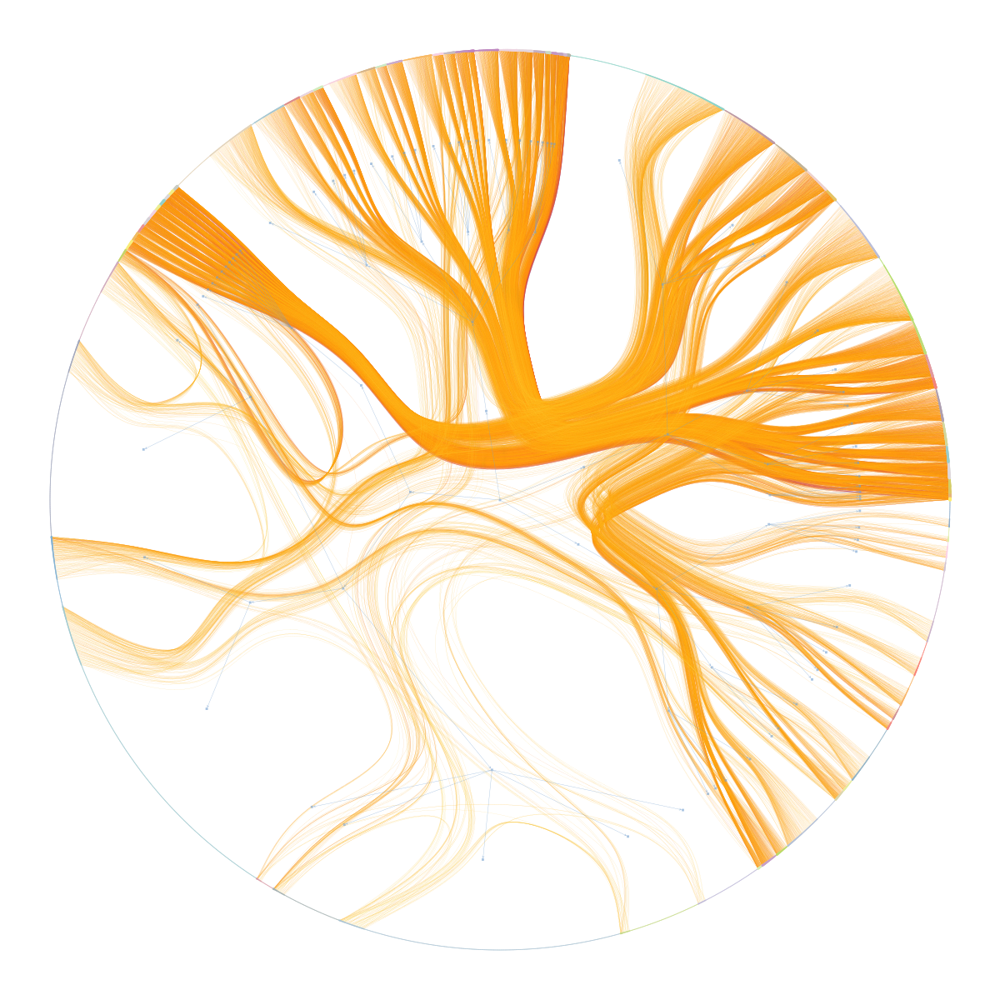

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd5ef234d00, at 0x7fd45ee3db80>,
 <Graph object, directed, with 5547 vertices and 5546 edges, at 0x7fd45ec3b130>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd45ec3b130, at 0x7fd45e368790>)

In [182]:
state_z_s.g = gf
layer_1 = state_z_s.g.new_ep("bool", True)
layer_1.a = state_z_s.g.ep.layer.a == -1
state_z_s.g = GraphView(state_z_s.g, efilt=layer_1)

state_z_s.draw(edge_color=prop_to_size(state_z_s.g.ep.z_s, mi=-2, ma=0, power=1, log=False),
               ecmap=(mpl.inferno, .6), edge_gradient=[], 
               eorder=state_z_s.g.ep.z_s, subsample_edges = 10000)

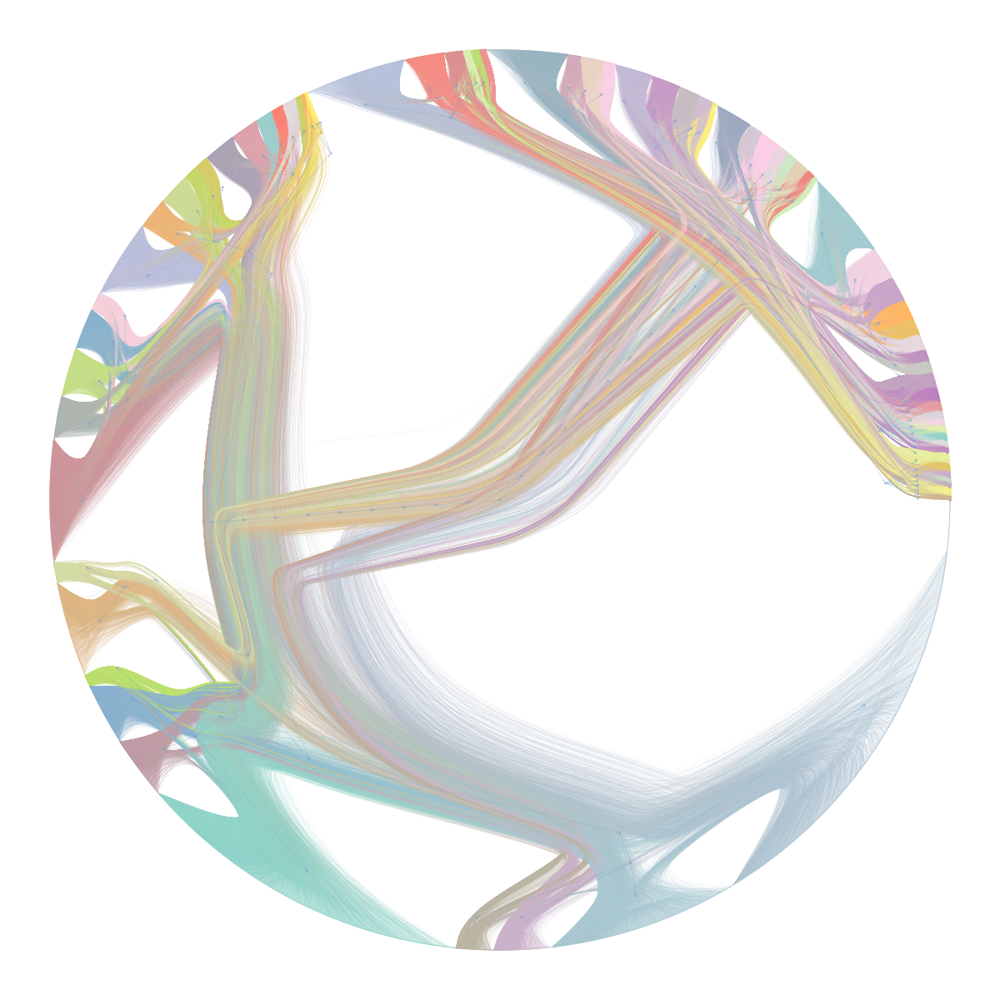

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd53b149520, at 0x7fd53b2056d0>,
 <Graph object, directed, with 5560 vertices and 5559 edges, at 0x7fd53b135c70>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd53b135c70, at 0x7fd53b135c10>)

In [130]:
state_layered.g = gf
layer_1 = state_layered.g.new_ep("bool", True)
layer_1.a = state_layered.g.ep.layer.a == 1
state_layered.g = GraphView(state_layered.g, efilt=layer_1)

state_layered.draw()

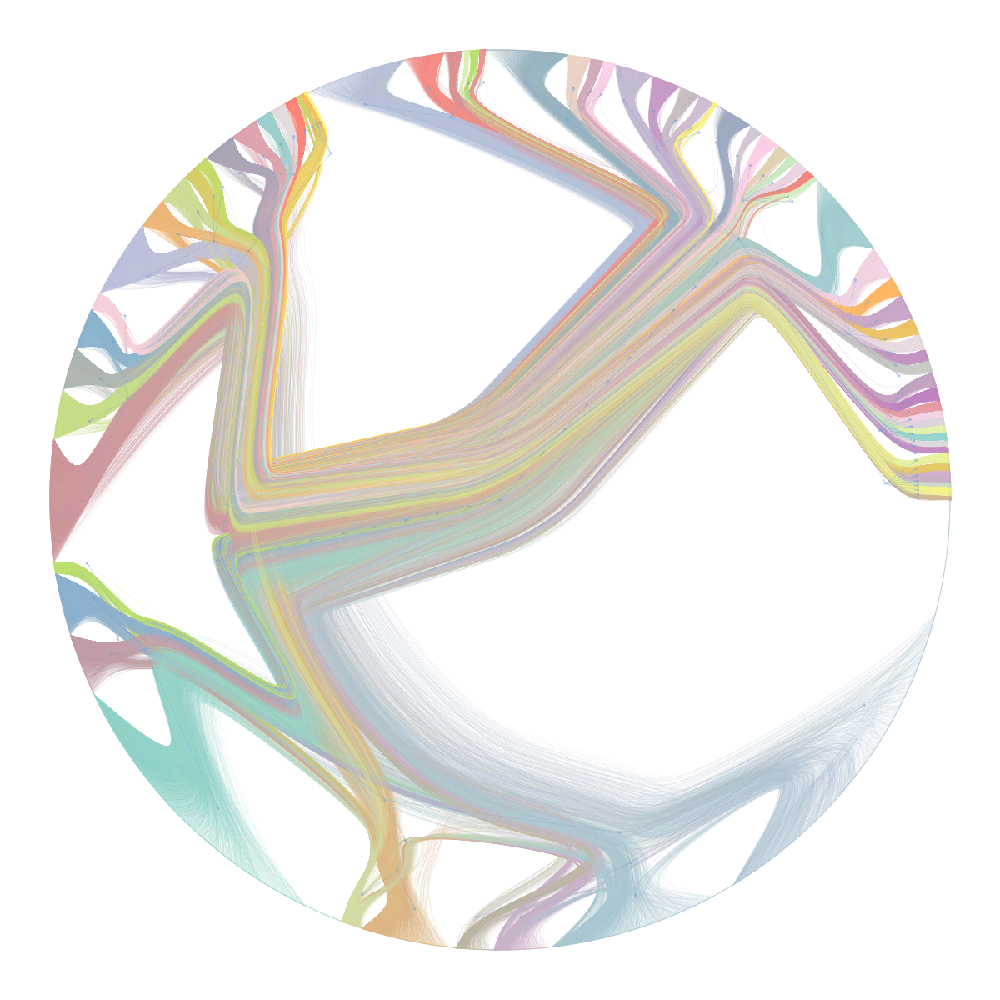

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd45feb5e80, at 0x7fd53b205a00>,
 <Graph object, directed, with 5560 vertices and 5559 edges, at 0x7fd53b10da30>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd53b10da30, at 0x7fd53b000df0>)

In [131]:
state_layered.g = gf
layer_1 = state_layered.g.new_ep("bool", True)
layer_1.a = state_layered.g.ep.layer.a == -1
state_layered.g = GraphView(state_layered.g, efilt=layer_1)

state_layered.draw()

In [132]:
state_layered.g = gf

In [97]:
state_layered.get_levels()[2].get_matrix().todense()

matrix([[     0.,      0.,      0.,      0.,      0.,      0.,      0.,
              0.,      0.,      0.,      0.,      0.,      0.],
        [     0.,  11278.,    915.,      0.,      0.,  44267.,      0.,
              0.,      0.,    727.,      0.,   7545.,      0.],
        [     0.,    915.,   1652.,      0.,      0.,   2993.,      0.,
              0.,      0.,   1241.,      0.,   1503.,      0.],
        [     0.,      0.,      0.,      0.,      0.,      0.,      0.,
              0.,      0.,      0.,      0.,      0.,      0.],
        [     0.,      0.,      0.,      0.,      0.,      0.,      0.,
              0.,      0.,      0.,      0.,      0.,      0.],
        [     0.,  44267.,   2993.,      0.,      0., 261166.,      0.,
              0.,      0.,   8992.,      0.,  29242.,      0.],
        [     0.,      0.,      0.,      0.,      0.,      0.,      0.,
              0.,      0.,      0.,      0.,      0.,      0.],
        [     0.,      0.,      0.,      0.,    

In [234]:
state_min.get_bstack()[1]

<Graph object, undirected, with 2965 vertices and 3559 edges, 2 internal vertex properties, 1 internal edge property, at 0x7fa7a84989d0>

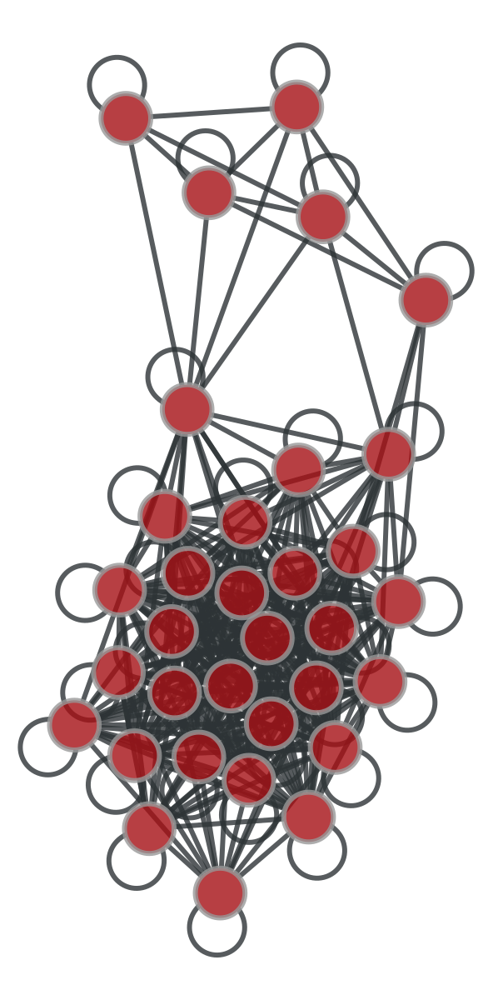

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fa66589a970, at 0x7fa6098ddb20>

In [251]:
tv = getMainComponent(state_min.get_bstack()[2])

graph_draw(tv)

In [52]:
def get_group(x, state):
    levels = state.get_levels()
    n_levels = 7#len(levels)
    r = np.zeros(n_levels)
    r[0] = levels[0].get_blocks()[x]
    for i in range(1, n_levels):
        r[i] = levels[i].get_blocks()[r[i-1]]
    r = r.astype(int)
    return r
def create_nestedBlock_df(g, state):
    genes = g.vertex_properties["genes"]
    correlation = g.edge_properties["correlation"]
    nested_block_df = pd.DataFrame(columns=('Gene', "Degree", "E_corr", 'B1', "B2", "B3", "B4", "B5", "B6", "B7"))
    for v in g.vertex_index:
        line = [genes[v]]
        line.append(g.get_total_degrees([v])[0])
        line.append(np.mean(g.get_all_edges(v, [correlation] )[:,2]))
        [line.append(i) for i in get_group(v, state)]
        nested_block_df.loc[v] = line
    return nested_block_df

In [53]:
nested_block_df = create_nestedBlock_df(gf, state_min)

In [66]:
nested_block_df
#nested_block_df.to_csv("../data/1502genes-Control_Head-hsbm-fit_df.csv")

,Gene,Degree,E_corr,B1,B2,B3,B4,B5
0,FBgn0024733,211,0.445620,1394,12,20,4,0
1,FBgn0023537,73,0.397302,799,84,14,4,0
2,FBgn0000108,225,0.436224,389,34,6,2,0
3,FBgn0025640,16,0.362250,617,71,8,0,0
4,FBgn0025638,3,0.375419,1186,43,24,0,0
...,...,...,...,...,...,...,...,...
2017,FBgn0021906,107,0.432894,617,71,8,0,0
2018,FBgn0028481,2,0.326209,1336,52,6,2,0
2019,FBgn0031306,56,0.376361,1624,52,6,2,0
2020,FBgn0031313,28,0.393526,525,68,24,0,0


In [200]:
bs = []
h = [np.zeros(gf.num_vertices() + 1) for s in state_min.get_levels()]

def collect_partitions(s):
    global bs
    bs.append(s.get_bs())
    for l, sl in enumerate(s.get_levels()):
       B = sl.get_nonempty_B()
       h[l][B] += 1
   

# Now we collect the marginals for exactly 100,000 sweeps
mcmc_equilibrate(state_min, force_niter=10000, mcmc_args=dict(niter=10),
                    callback=collect_partitions)

(313418.28701300896, 358726951, 20337151)

In [35]:
# Disambiguate partitions and obtain marginals
pmode = PartitionModeState(bs, nested=True, converge=True)

pv = pmode.get_marginal(gf)

# Get consensus estimate
bs_max = pmode.get_max_nested()

state = state_min.copy(bs=bs_max)

(313358.0505201311, 359634575, 21662086)

In [199]:
# Infer partition modes
pmode = ModeClusterState(bs, nested=True)

# Minimize the mode state itself
mcmc_equilibrate(pmode, wait=1, mcmc_args=dict(niter=1, beta=np.inf))

# Get inferred modes
modes = pmode.get_modes()

for i, mode in enumerate(modes):
    b = mode.get_max_nested()    # mode's maximum
    pv = mode.get_marginal(g)    # mode's marginal distribution

    print(f"Mode {i} with size {mode.get_M()/len(bs)}")
    state_mode = state.copy(bs=b)
    state_mode.draw()

TypeError: object of type 'numpy.int32' has no len()

In [39]:
state_min.entropy() - state.entropy()

873.5413029484916

In [304]:
level_1 = state_z_s.g.new_vertex_property("int")
level_1.a = state_z_s.get_bs()[0]
modularity(g = state_z_s.g, b = level_1, weight=state_z_s.g.ep.z_s)

0.0433181862213653

In [312]:
g_2 = state_z_s.get_bstack()[2]
g_2.

PropertyArray([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
                  0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
                  0,    0,    0,    0,    0,    0,    0,    0,    0, 4526,
                  0,    0,    0,    0,    0,    0,    0,    0, 6050,    0,
                  0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
                  0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
                  0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
                  0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
                  0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
                  0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
                  0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
                  0,    0,    0,    0,    0,    0,    0,    0,  861,    0,
                  0,    0,    0,    0, 1509,    0,    0,    0,    0,    0,
                502,    0

In [219]:
block_df = pd.read_csv("../data/output/SBM/clustering/body_weights-spearman_fdr-1e-03_hierarchical-SBM.csv")

In [210]:
nestedBlock_df

,Unnamed: 0,Gene,Degree,E_corr,B1,B2,B3,B4,B5,B6
0,0,FBgn0024733,533,0.473920,0,0,0,3,0,1
1,1,FBgn0040372,114,0.369680,1,3,1,1,1,1
2,2,FBgn0023537,52,0.353175,101,43,2,0,0,1
3,3,FBgn0025640,6,0.343265,53,16,2,0,0,1
4,4,FBgn0025635,1,0.332706,1,3,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...
2960,2960,FBgn0040723,214,0.415660,75,9,2,0,0,1
2961,2961,FBgn0031313,314,0.376394,44,20,7,3,0,1
2962,2962,FBgn0031305,101,0.358008,2,2,2,0,0,1
2963,2963,FBgn0016926,22,0.357533,85,27,12,2,2,1


In [223]:
for level in range(1, 7):
    gf.vertex_properties["v_color"] = gf.new_vertex_property("double", 
                                                             nestedBlock_df[["B"+str(level)]].to_numpy().T[0].astype(int))
    graph_draw(gf, vertex_fill_color=gf.vertex_properties["v_color"], 
               edge_pen_width=gf.edge_properties["spearman"], 
               output = "../data/output/SBM/plots/body_non-nested-graph_mcmc_cutoff-spearman_val-0.325_hierarchical-SBM_level"+str(level)+".png")

In [220]:
set(nestedBlock_df[["B5"]].to_numpy().T[0].astype(int))

{0, 1, 2}

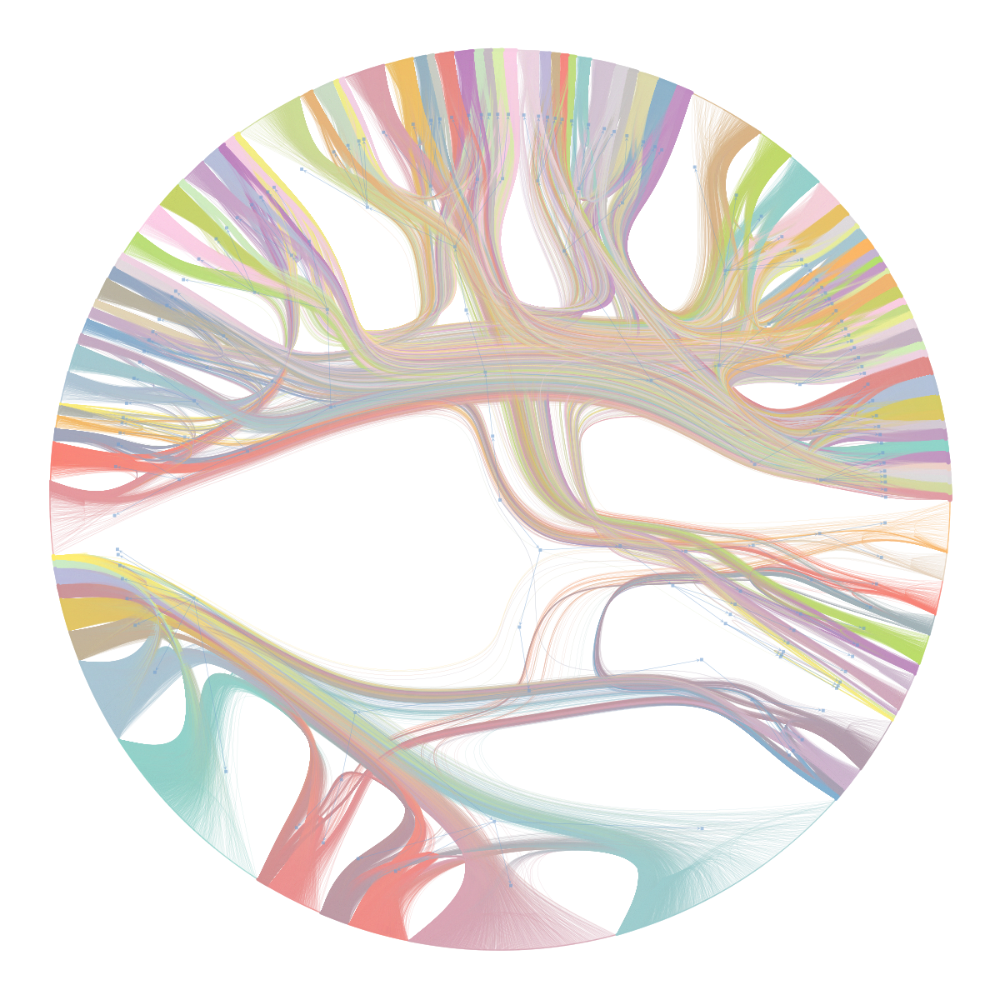

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fa7a848c5b0, at 0x7fa609e9b9a0>,
 <Graph object, directed, with 3141 vertices and 3140 edges, at 0x7fa609cd6fa0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fa609cd6fa0, at 0x7fa60a004e20>)

In [198]:
state.draw()

In [194]:
pd.DataFrame(h).to_csv("../data/output/SBM/clustering/head_cutoff-spearman_val-0.4_hierarchical-SBM_levels_histogram.csv")


In [252]:
state_min_pp = minimize_blockmodel_dl(gf, state=PPBlockState)
mcmc_equilibrate(state_min_pp, wait = 100, mcmc_args=dict(niter=10))

(362772.8582000348, 134998533, 22184612)

In [254]:
state_min.entropy()

313418.2870130081

In [255]:
state_min_nn.entropy()

318913.9251832847

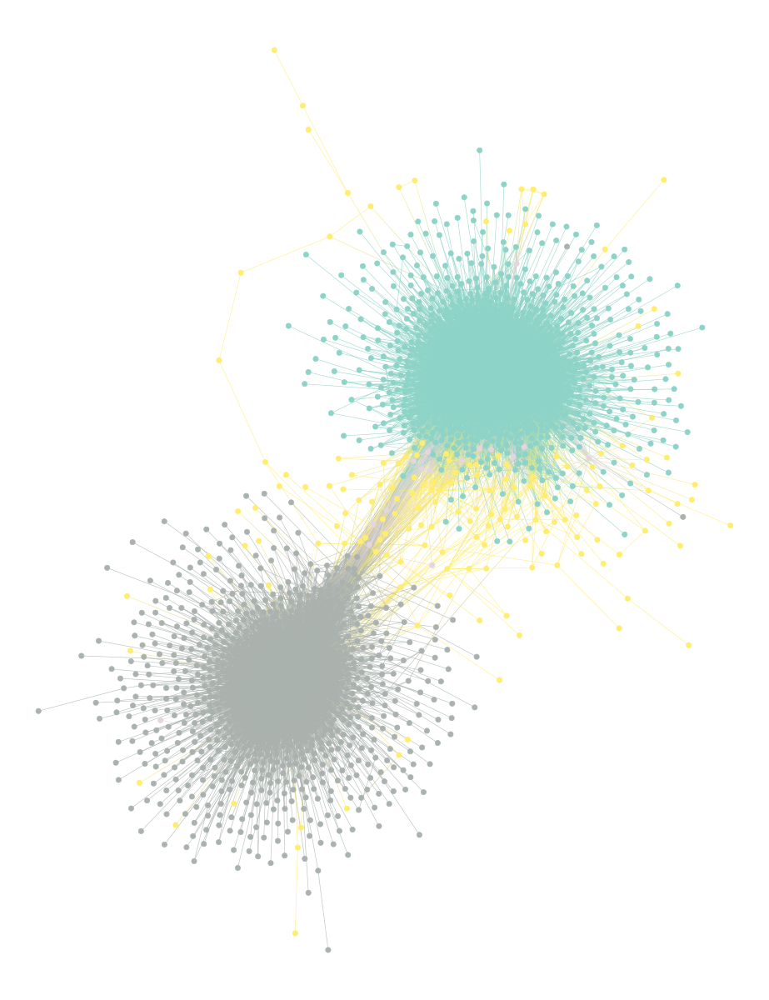

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fa609ff3ee0, at 0x7fa60a2237f0>

In [258]:
state_min_pp.draw()

In [260]:
state_min_pp.get_nonempty_B()

4